<a rel="license" href="http://creativecommons.org/licenses/by/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by/4.0/80x15.png" /></a><br />This tutorial by Xiaozhou Li is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by/4.0/">Creative Commons Attribution 4.0 International License</a>.  
All code examples are also licensed under the [MIT license](http://opensource.org/licenses/MIT).

# Hyperbolic Conservation Laws

\begin{equation*}
\newcommand{Dx}{\Delta x}
\newcommand{Dt}{\Delta t}
\newcommand{imh}{{i-1/2}}
\newcommand{iph}{{i+1/2}}
\end{equation*}
Many models of wave phenomena are governed by *hyperbolic conservation laws*.  In this short course, we will learn about hyperbolic conservation laws and their numerical solution.

## Conservation of mass
Imagine a fluid flowing in a narrow tube.  We'll use $u$ to indicate the density of the fluid and $\nu$ to indicate its velocity.  Both of these are functions of space and time: $u = u(x,t)$; $\nu=\nu(x,t)$.  The total mass in the section of tube $[x_1,x_2]$ is

\begin{equation}
\int_{x_1}^{x_2} u(x,t) dx.
\end{equation}

This total mass can change in time due to fluid flowing in or out of this section of the tube.  We call the rate of flow the *flux*, and represent it with the function $f(u)$.  Thus the net rate of flow of mass into (or out of) the interval $[x_1,x_2]$ at time $t$ is

$$f(u(x_1,t)) - f(u(x_2,t)).$$

We just said that this rate of flow must equal the time rate of change of total mass; i.e.

$$\frac{d}{dt} \int_{x_1}^{x_2} u(x,t) dx = f(u(x_1,t)) - f(u(x_2,t)).$$

Now since $\int_{x_1}^{x_2} \frac{\partial}{\partial x} f(u) dx = f(u(x_2,t)) - f(u(x_1,t))$, we can rewrite this as

$$\frac{d}{dt} \int_{x_1}^{x_2} u(x,t) dx = -\int_{x_1}^{x_2} \frac{\partial}{\partial x} f(u) dx.$$

Under certain smoothness assumptions on $u$, we can move the time derivative inside the integral.  We'll also put everything on the left side, to obtain

$$\int_{x_1}^{x_2} \left(\frac{\partial}{\partial t}u(x,t) + \frac{\partial}{\partial x} f(u)\right) dx = 0.$$

Since this integral is zero for *any* choice of $x_1,x_2$, it must be that the integrand (the expression in parentheses) is actually zero *everywhere*!  Therefore we can write the **differential conservation law**

$$u_t + f(u)_x = 0.$$

Here and throughout the course, we use subscripts to denote partial derivatives.
This equation expresses the fact that the total mass is conserved -- since locally the mass can change only due to a net inflow or outflow.

## Advection
In order to solve the conservation law above, we need an expression for the flux, $f$.  The rate of flow is just mass times velocity: $f=\nu u$.  Thus we obtain the **continuity equation**

$$u_t + (\nu u)_x = 0.$$

In general, we need another equation to determine the velocity $\nu(x,t)$, for example, see the full equations of fluid dynamics, but for now let's consider the simplest case, in which all of the fluid flows at a single, constant velocity $\nu(x,t)=a$.  Then the continuity equation becomes the **advection equation**

$$u_t + a u_x = 0.$$

This equation has a very simple solution.  If we are given the density $u(x,0)=u_0(x)$ at time zero, then the solution is just

$$u(x,t) = u_0(x-at).$$

Let's plot the solution of the advection equation on the interval $[0,1]$ for the initial condition
$$q_0(x) = e^{-2(x-1/2)^2}.$$

In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation

In [4]:
from IPython.display import HTML

def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim.to_jshtml())

First, we'll set up a grid and the initial condition:

In [52]:
x = np.linspace(0,1,1000)  # Spatial grid
t = np.linspace(0,1,50)       # Temporal grid
a = 1.0                    # Advection speed

def u0_1(x):                # Initial condition
    return np.exp(-200.*(x-0.2)**2)

def u0_2(x):
    return np.sin(2.*np.pi*x)

In [54]:
fig = plt.figure(figsize=(8,4))      # Create an empty figure
ax  = plt.axes()
line, = ax.plot([], [],linewidth=2)  # Create an empty line plot
#plt.axis((0,1,-0.1,1.1))             # Set the bounds of the plot
plt.axis((0,1,-1.1,1.1))             # Set the bounds of the plot

u0 = u0_2
def plot_u(t):
    line.set_data(x,u0(x-a*t))  # Replace the line plot with the solution at time t
    
anim = animation.FuncAnimation(fig, plot_u, frames=t)  # Animate the solution

display_animation(anim)

As you can see, the initial pulse just moves to the right at speed $a$ as time advances.  This isn't very interesting, but it captures the most important feature of hyperbolic equations: waves travel at finite speed.

## Characteristics
Notice that the solution value is constant along the line $x-at=x_0$, in the $x-t$ plane, for each value of $x_0$.  These lines are called **characteristics**; they are the trajectories along which solution information is transmitted.  The value $a$ is referred to as the **characteristic velocity**.  The code below plots some of these characteristics.

When we learn about more complicated conservation laws, we'll see that information still travels along characteristics, but those characteristics aren't necessarily straight lines.

(0, 1)

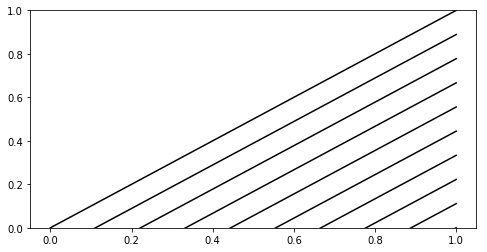

In [13]:
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

for x_0 in np.linspace(0,1,10):
    ax.plot(x,(x-x_0)/a,'-k')
plt.ylim(0,1)

# Finite Difference Methods for Advection Equation

## First approach
The first approach we might consider is the analogue of the method for the heat equation. Using the centered difference in space and the forward difference in time results in the numerical method
$$ \frac{U_j^{n+1} - U_j^n}{\Delta t} = -\frac{a}{\Delta x}(U_{j+1}^n - U_{j-1}^n)$$
which can be rewritten as
$$ U_j^{n+1} = U_j^n -\frac{a\Delta t}{\Delta x}(U_{j+1}^n - U_{j-1}^n)$$

In [36]:
def u_0(x):
    return np.sin(2*np.pi*x)

#def u_0(x):                # Initial condition
#    return np.exp(-200.*(x-0.2)**2)

0.0 -2.4492935982947064e-16


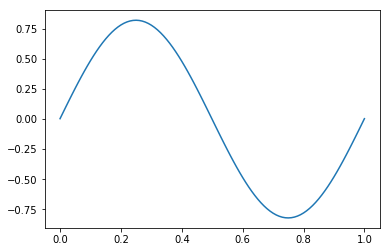

In [41]:
def generate_grid(left, right, m):
    dx = (right - left)/(m+1)
    x = np.linspace(left, right, m+2)
    return  x, dx

left = 0.
right = 1.
m = 99
x, dx = generate_grid(left, right, m)

# initial conditions
u = u_0(x)
t = 0
t_final = 1
dt = 0.01*dx

# periodic boundary conditions
u[0] = u[m+1]

while (t+dt < t_final):
    t = t+dt
      
    #u[1:m+1] = u[1:m+1] - a*dt/dx*(u[2:] - u[:m])
    u[1:] = u[1:] - a*dt/dx*(u[1:] - u[:m+1])
    #u[m+1] = u[m+1] - a*dt/dx*(u[1] - u[m+1])
    
    # periodic boundary conditions
    u[0] = u[m+1]
    
# finial step
dt = t_final - t

u[1:] = u[1:] - a*dt/dx*(u[1:] - u[:m+1])
#u[1:m+1] = u[1:m+1] - a*dt/dx*(u[2:] - u[:m+1])
#u[m+1] = u[m+1] - a*dt/dx*(u[1] - u[m+1])
    
# periodic boundary conditions
u[0] = u[m+1]

plt.plot(x, u)
plt.show()

In [65]:
def First_approach(a, u, m, dt, dx):
    u[1:m+1] = u[1:m+1] - a*dt/dx*(u[2:] - u[:m])
    u[m+1] = u[m+1] - a*dt/dx*(u[1] - u[m])
    
    # periodic boundary conditions
    u[0] = u[m+1]
    return u

In [66]:
def time_step(a, t_final, t, dt, u, m, dx, scheme):
    while (t+dt < t_final):
        t = t+dt
        u = scheme(a, u, m, dt, dx)
        
    # finial step
    dt = t_final - t
    u = scheme(a, u, m, dt, dx)
    return u

In [67]:
def initial(left, right, m, u0, cfl):
    x, dx = generate_grid(left, right, m)
    u = u0(x)
    dt = cfl*dx
    
    return u, x, dx, dt 

In [94]:
def FDM_Advection(left, right, m, a, u0, t0, t_final, cfl, scheme):
    u, x, dx, dt = initial(left, right, m, u0, cfl)
    
    # periodic boundary conditions
    u[0] = u[m+1]
    
    # moving forward in time 
    u = time_step(a, t_final, t0, dt, u, m, dx, scheme)
    
    u_exact = u0(x - a*t_final)
    
    #plt.plot(x, u)
    #plt.plot(x, u_exact)
    #plt.show()
    
    return x, u, u_exact

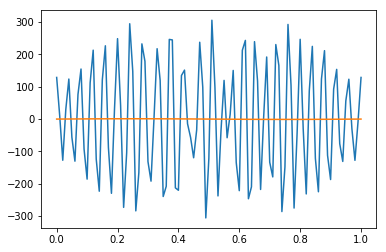

In [109]:
left = 0.
right = 1.
a = 1
t0 = 0
t_final = 1.

m = 99
cfl = 0.1

x, u, u_exact = FDM_Advection(left, right, m, a, u0_2, t0, t_final, cfl, First_approach)
plt.plot(x, u)
plt.plot(x, u_exact)
plt.show()

In [114]:
fig = plt.figure(figsize=(8,4))      # Create an empty figure
ax  = plt.axes()
line, = ax.plot([], [],linewidth=2)  # Create an empty line plot
#plt.axis((0,1,-0.1,1.1))             # Set the bounds of the plot
plt.axis((0,1,-1.1,1.1))             # Set the bounds of the plot

scheme = First_approach
def plot_u(t):
    x, u, u_exact = FDM_Advection(left, right, m, a, u0_2, t0, t, cfl, scheme)
    line.set_data(x,u)  # Replace the line plot with the solution at time t
    
t = np.linspace(0,1,101)     
anim = animation.FuncAnimation(fig, plot_u, frames=t)  # Animate the solution
display_animation(anim)

In [116]:
def Upwind(a, u, m, dt, dx):
    u[1:] = u[1:] - a*dt/dx*(u[1:] - u[:m+1])
    
    # periodic boundary conditions
    u[0] = u[m+1]
    return u

In [117]:
x, u, u_exact = FDM_Advection(left, right, m, a, u0_2, t0, t_final, cfl, Upwind)

In [118]:
scheme = Upwind
anim = animation.FuncAnimation(fig, plot_u, frames=t) 
display_animation(anim)

In [124]:
def Downwind(a, u, m, dt, dx):
    u[1:m+1] = u[1:m+1] - a*dt/dx*(u[2:] - u[1:m+1])
    u[m+1] = u[m+1] - a*dt/dx*(u[1] - u[m])
    
    # periodic boundary conditions
    u[0] = u[m+1]
    return u

In [125]:
x, u, u_exact = FDM_Advection(left, right, m, a, u0_2, t0, t_final, cfl, Downwind)

In [127]:
scheme = Downwind
anim = animation.FuncAnimation(fig, plot_u, frames=t) 
display_animation(anim)

In [119]:
def Lax_Wendroff(a, u, m, dt, dx):
    u[1:m+1] = u[1:m+1] - a*dt/dx*(u[2:] - u[:m]) + (a*dt/dx)**2*(u[2:] - 2*u[1:m+1] + u[:m])
    u[m+1] = u[m+1] - a*dt/dx*(u[1] - u[m]) + (a*dt/dx)**2*(u[1] - 2*u[m+1] + u[m])
    
    # periodic boundary conditions
    u[0] = u[m+1]
    return u

In [120]:
x, u, u_exact = FDM_Advection(left, right, m, a, u0_2, t0, t_final, cfl, Lax_Wendroff)

In [121]:
scheme = Lax_Wendroff
anim = animation.FuncAnimation(fig, plot_u, frames=t)  
display_animation(anim)